# Homework3. Clustering and tSNE

In [649]:
import warnings
import pandas as pd
import numpy as np
import random
import seaborn as sns
import matplotlib.pyplot as plt

from os.path import join
from IPython import display
from sklearn.datasets import load_digits
from sklearn.datasets import make_blobs
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import (silhouette_score, homogeneity_completeness_v_measure, pairwise_distances)
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

In [400]:
DATA_PATH = "data"
plt.rcParams["figure.figsize"] = 12, 9
sns.set_style("whitegrid")
warnings.filterwarnings("ignore")

SEED = 111
random.seed(SEED)
np.random.seed(SEED)

### Задание 1. Реализация Kmeans

5 баллов

В данном задании вам предстоит дописать код класса `MyKMeans`. Мы на простом примере увидим, как подбираются центры кластеров и научимся их визуализировать.

Сгенерируем простой набор данных, 400 объектов и 2 признака (чтобы все быстро работало и можно было легко нарисовать):

In [486]:
X, true_labels = make_blobs(400, 2, centers=[[0, 0], [-4, 0], [3.5, 3.5], [3.5, -2.0]])

Напишем функцию `visualize_clusters`, которая по данным и меткам кластеров будет рисовать их и разукрашивать:

In [475]:
def visualize_clusters(X, labels):
    """
    Функция для визуализации кластеров
        :param X: таблица объекты х признаки
        :param labels: np.array[n_samples] - номера кластеров
    """
    fig, ax = plt.subplots(dpi=300)
    unique_labels = np.sort(np.unique(labels))
    sns.scatterplot(X[:, 0], X[:, 1], hue=labels, 
                    palette="Set2", legend=False,
                    hue_order=unique_labels, ax=ax)
    plt.xlabel("$X_1$", fontsize=18)
    plt.ylabel("$X_2$", fontsize=18)
    
    for label in labels:
        center = X[(labels == label)].mean(axis=0)
        plt.scatter(center[0], center[1], s=80, c="#201F12", marker=(5, 2))

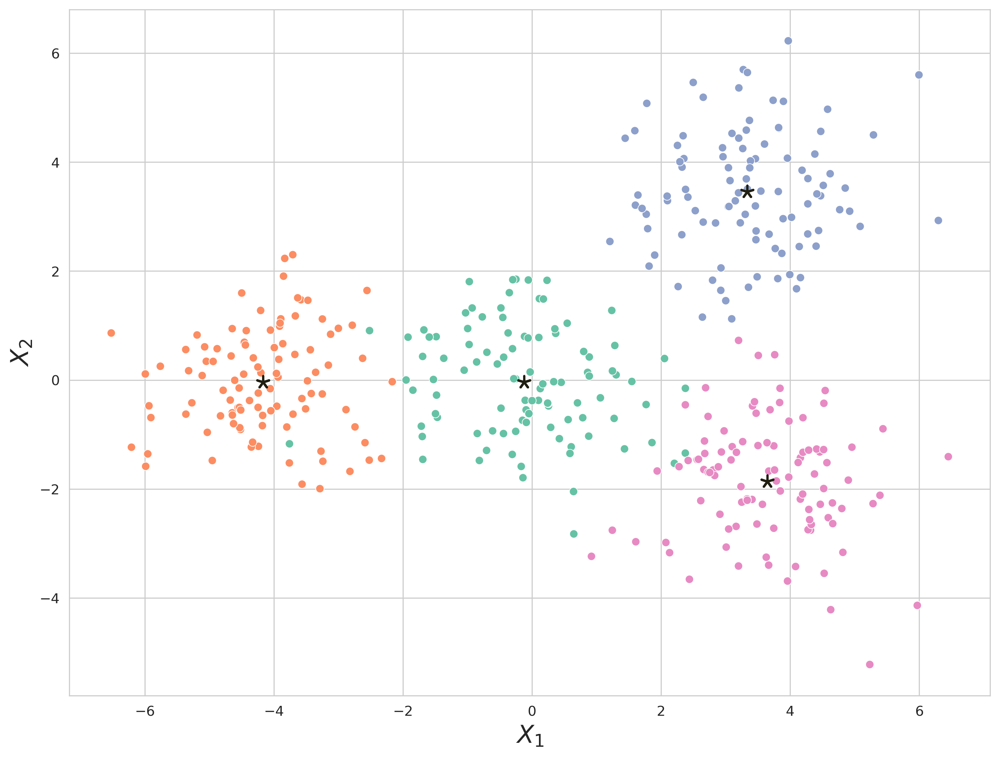

In [476]:
visualize_clusters(X, true_labels)

Напишем свой класс `MyKMeans`, который будет реализовывать алгоритм кластеризации K-средних. Напомним сам алгоритм:

1. Выбераем число кластеров (K)
2. Случайно инициализируем K точек (или выбираем из данных), это будут начальные центры наших кластеров
3. Далее для каждого объекта считаем расстояние до всех кластеров и присваиваем ему метку ближайщего
4. Далее для каждого кластера считаем "центр масс" (среднее значение для каждого признака по всем объектам кластера)
5. Этот "центр масс" становится новым центром кластера
6. Повторяем п.3, 4, 5 заданное число итераций или до сходимости

Во время предсказания алгоритм просто находит ближайщий центроид (центр кластера) для тестового объекта и возвращает его номер.

Реализуйте методы:
* `_calculate_distance(X, centroid)` - вычисляет Евклидово расстояние от всех объектов в `Х` до заданного центра кластера (`centroid`)
* `predict(X)` - для каждого элемента из `X` возвращает номер кластера, к которому относится данный элемент

In [404]:
class MyKMeans:
    def __init__(self, n_clusters, init="random", max_iter=300, visualize=False):
        """
        Конструктор класса MyKMeans
            :param n_clusters: число кластеров
            :param init: способ инициализации центров кластеров
                'random' - генерирует координаты случайно из нормального распределения
                'sample' - выбирает центроиды случайно из объектов выборки
            :param max_iter: заданное число итераций 
                (мы не будем реализовывать другой критерий остановки)
            :param visualize: рисовать ли кластеры и их центроиды в процессе работы
                код будет работать сильно дольше, но красиво...
        """
        
        assert init in ["random", "sample"], f"Неизвестный метод инициализации {init}"
        self.n_clusters = n_clusters
        self.init = init
        self.max_iter = max_iter
        self.centroids = None
        self.visualize = visualize
       
    
    def fit(self, X):
        """
        Подбирает оптимальные центры кластеров
            :param X: наши данные (n_samples, n_features)
        :return self: все как в sklearn
        """
        
        n_samples, n_features = X.shape
        
        # Инициализация центров кластеров
        if self.init == "random":
            centroids = np.random.randn(self.n_clusters, n_features)
        elif self.init == "sample":
            centroids_idx = np.random.choice(np.arange(n_samples), 
                                             size=self.n_clusters, 
                                             replace=False)
            centroids = X[centroids_idx]
        
        # Итеративно двигаем центры
        for _ in range(self.max_iter):
            # Посчитаем расстояния для всех объектов до каждого центроида
            dists = []
            for centroid in centroids:
                dists.append(self._calculate_distance(X, centroid))
            dists = np.array(dists)
            # Для каждого объекта найдем, к какому центроиду он ближе
            cluster_labels = np.argmin(dists, axis=0)
            
            # Пересчитаем центр масс для каждого кластера
            centroids = []
            for label in np.sort(np.unique(cluster_labels)):
                center = X[(cluster_labels == label)].mean(axis=0)
                centroids.append(center)
            
            # Отрисуем точки, покрасим по меткам кластера, а также изобразим центроиды
            if self.visualize:
                visualize_clusters(X, cluster_labels)
                display.clear_output(wait=True)
                display.display(plt.gcf())
                plt.close()
                
        self.centroids = np.array(centroids)
        
        return self
    
    
    def predict(self, X):
        """
        Для каждого X возвращает номер кластера, к которому он относится
            :param X: наши данные (n_samples, n_features)
        :return cluster_labels: метки кластеров
        """
        
        
        distances = [] 
        for centroid in self.centroids:
            # calculating distances to all centroids
            dist = self._calculate_distance(X, centroid)
            distances.append(dist)
        distances = np.array(distances)
        # choosing label by min distance to centroid
        cluster_labels = np.argmin(distances, axis=0)
        return cluster_labels
        
        
    def _calculate_distance(self, X, centroid):
        """
        Вычисляет Евклидово расстояние от всех объектов в Х до заданного центра кластера (centroid)
            :param X: наши данные (n_samples, n_features)
            :param centroid: координаты центра кластера
        :return dist: расстояния от всех X до центра кластера
        """
        
        dist = np.linalg.norm((X - centroid), axis=1)
        return dist
    
    
    def calculate_metric(self, X, pred_labels):
        print(f'Silhouette score: {silhouette_score(X, pred_labels)}')
    
    
    def __repr__(self):
        return f"Привет, я твой KMeans (/¯◡ ‿ ◡)/¯☆*"

Обучите `MyKMeans` на наших игручешных данных, добейтесь сходимости. Не забудьте поставить `visualize=True`, чтобы посмотреть на красивые картинки. Также попробуйте различные способы инициализации центроидов и скажите, какой лучше подошел в этой ситуации.

 - `MyKMeans()` with **random** initialization for centroids

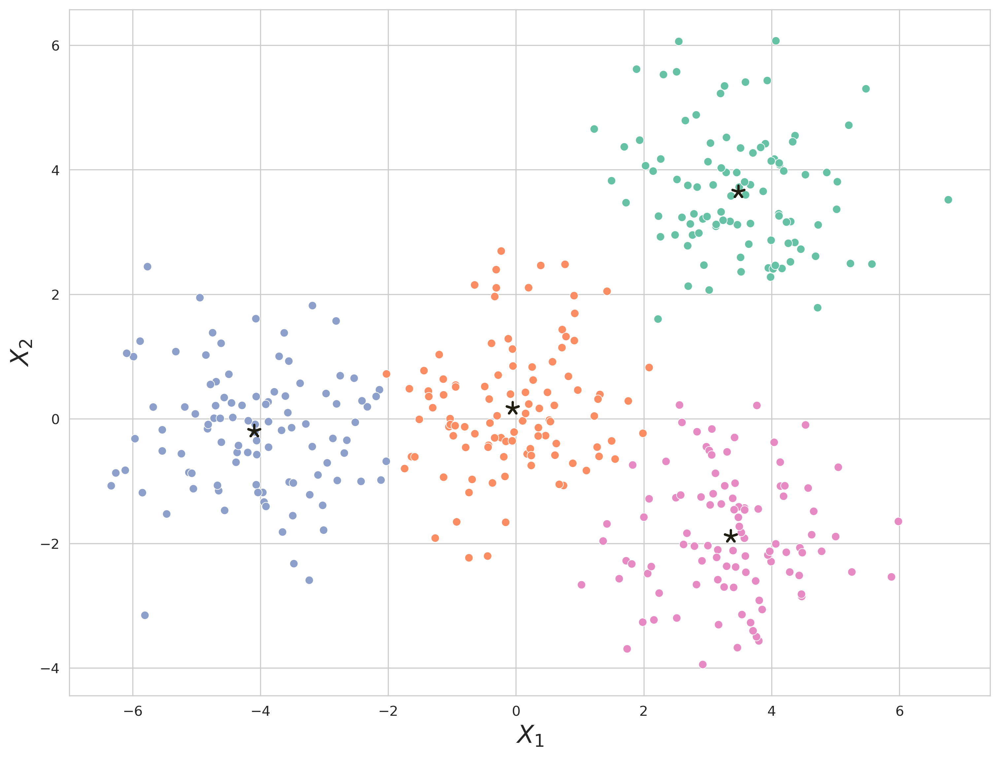

Привет, я твой KMeans (/¯◡ ‿ ◡)/¯☆*

In [405]:
# fitting model with random centroids
my_kmeans_random = MyKMeans(n_clusters=4, init="random", max_iter=15, visualize=True)
my_kmeans_random.fit(X)

In [406]:
# predicting labels
pred_labels_random = my_kmeans_random.predict(X)
my_kmeans_random.calculate_metric(X, pred_labels_random)

Silhouette score: 0.5643117184043004


 - `MyKMeans()` with centroids initialization from **samples** 

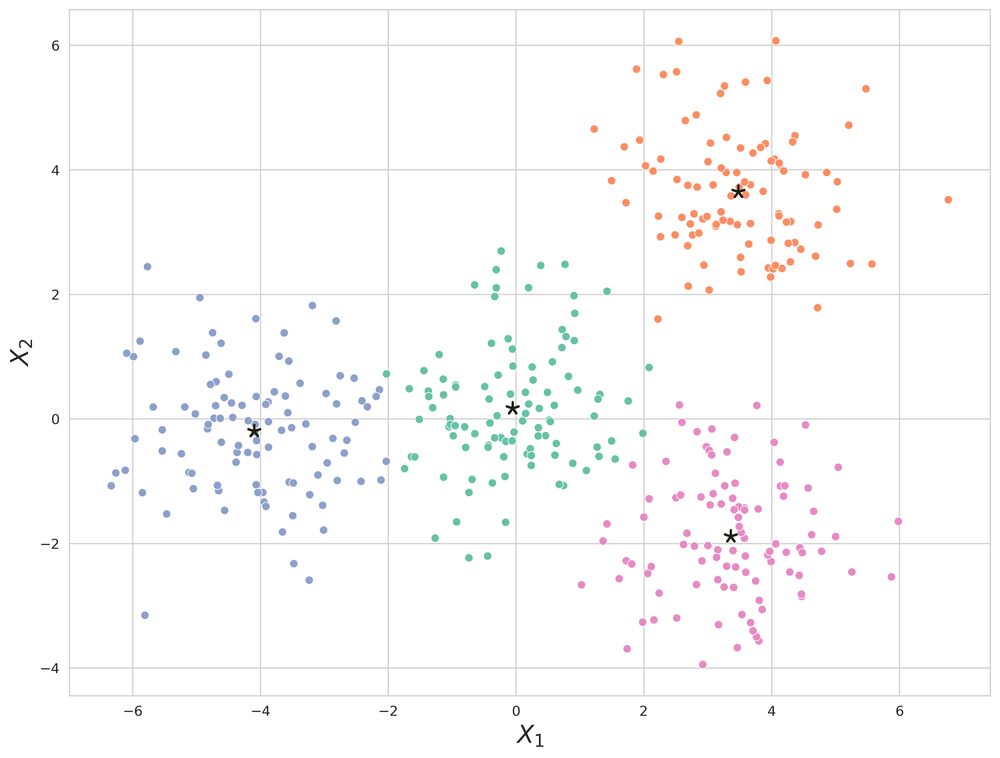

Привет, я твой KMeans (/¯◡ ‿ ◡)/¯☆*

In [407]:
# fitting model with centroids from samples
my_kmeans_sample = MyKMeans(n_clusters=4, init="sample", max_iter=15, visualize=True)
my_kmeans_sample.fit(X)

In [408]:
# predicting labels
pred_labels_sample = my_kmeans_random.predict(X)
my_kmeans_sample.calculate_metric(X, pred_labels_random)

Silhouette score: 0.5643117184043004


There is no difference in *silhouette score* when using `MyKMeans()` with both random and selected from samples centroids. For this simple example the metric is not bad.  

### Задание 2. Подбираем лучшую иерархическую кластеризацию

5 баллов

На лекции были рассмотрены различные расстояния, которые могут служить метриками различия между объектами. Также мы разобрали несколько алгоритмов кластеризации, в том числе и иерархическую. Часто может быть непонятно, какой алгоритм и какую метрику расстояния нужно взять. Давайте упростим себе жизнь и напишем функцию `algorithm_selection`, которая будет на основании переданных ей:

* метрик расстояния (можно брать все, что было на лекциях, минимум 4)
* параметра `linkage` ('average', 'single', 'complete')
* и метрик качества кластеризации ('Homogeneity', 'Completeness', 'V-measure', 'Silhouette')

будет выводить итоговую таблицу, в которую войдут столбцы:
* distance (метрика расстояния)
* linkage (алгоритм иерархической кластеризации)
* homogenity
* completeness
* v_measure
* silhouette

В результате по этой таблице, нужно сделать вывод о том, какой алгоритм кластеризации и с какими гиперпараметрами лучше всего сработал.

Загрузим наши данные:

In [409]:
data = load_digits()
X, y = data.data, data.target

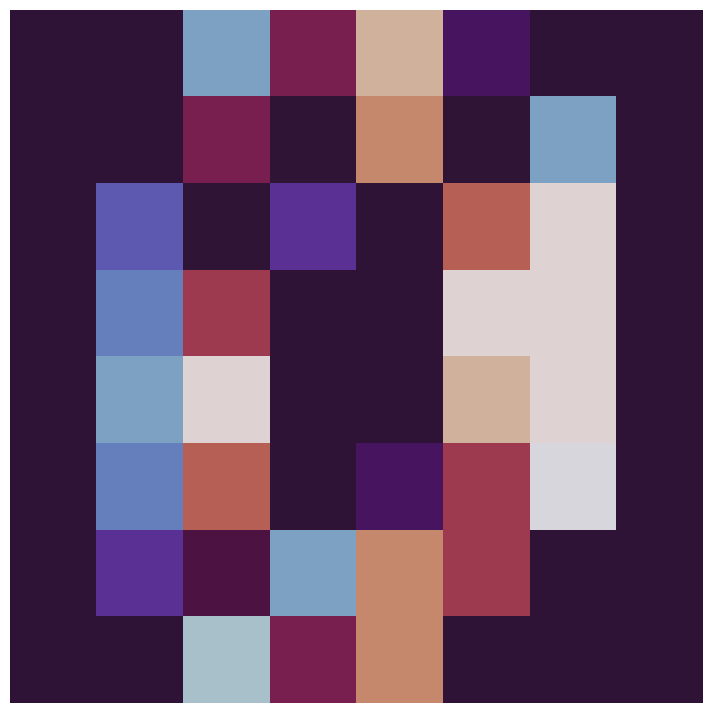

In [410]:
plt.imshow(X[0].reshape(8, 8).astype(int), cmap="twilight_shifted")
plt.axis("off");

I decided to visualize digit representatives (just for fun).

In [411]:
# determing names for digit classes and indexes for the first their representatives
digits, digits_indexes = np.unique(y, return_index=True)

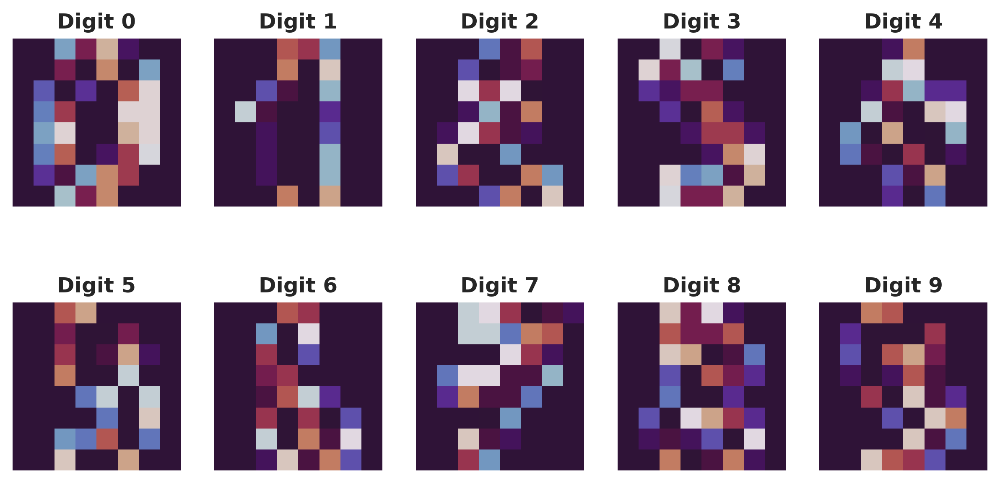

In [412]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(10, 5), dpi=300)
   
for digit, idx, ax in zip(digits, digits_indexes, axes.flat):
    digit_repr = X[idx].reshape(8, 8, 1).astype(int)
    ax.imshow(digit_repr, cmap="twilight_shifted")
    ax.axis("off")
    ax.set_title(f'Digit {digit}', 
                 fontsize=12, 
                 fontweight='bold')
plt.show();

Работать будем с изображениями рукописных цифр. Тут все похоже на данные для 1 домашнего задания, каждая картинка представлена вектором из 64 элементов (числа от 0 до 255). Чтобы ее нарисовать мы должны сделать `reshape` в картинку 8 на 8 пикселей. Вам нужно будет выбрать наилучший способ кластеризации при помощи функции `algorithm_selection`, которую вы реализуете. Для некоторых метрик кластеризации требуются метки **классов** объектов (они хранятся в переменной `y`).

##### YOUR TURN TO CODE

In [414]:
def algorithm_selection(X, n_clusters, distances, algorithms, true_labels=None):
    """
    Для заданных алгоримов кластеризации и гиперпараметров 
    считает различные метрики кластеризации
        :param X: наши данные (n_samples, n_features)
        :param n_clusters: количество кластеров
        :param distances: список возможных метрик расстояния
        :param algorithm: параметр linkage ('average', 'single', 'complete')
        :param true_labels: известные классы для данных X
    :return compare_dataframe: таблица с метриками кластеризации
    """

    
    compare_dict = {"distance": [], "linkage": [], "silhouette": []}
    compare_metrics = {"homogeneity": [], "completeness": [], "v_measure": []}
        
    for dist in distances:
        for alg in algorithms:
            compare_dict["distance"].append(dist)
            compare_dict["linkage"].append(alg)
            agg_clust = AgglomerativeClustering(n_clusters=n_clusters, affinity=dist, linkage=alg)
            pred_labels = agg_clust.fit_predict(X)
            compare_dict["silhouette"].append(silhouette_score(X, pred_labels, metric=dist))
    
            if true_labels is not None:
                homo, compl, v = homogeneity_completeness_v_measure(true_labels, pred_labels)
                compare_metrics["homogeneity"].append(homo)
                compare_metrics["completeness"].append(compl)
                compare_metrics["v_measure"].append(v)
                
    if true_labels is not None:
        compare_dict.update(compare_metrics)
        compare_dataframe = pd.DataFrame(compare_dict)
    else:
        compare_dataframe = pd.DataFrame(compare_dict)    
    return compare_dataframe

In [415]:
algorithms = ['average', 'single', 'complete']
distances = ["euclidean", "manhattan", "cosine", "chebyshev", "minkowski"]

In [416]:
arg_selection = algorithm_selection(X, n_clusters=10, distances=distances, 
                                    algorithms=algorithms, true_labels=y)
arg_selection.sort_values(["silhouette"], ascending=False)

,distance,linkage,silhouette,homogeneity,completeness,v_measure
6,cosine,average,0.218229,0.648268,0.808762,0.719676
5,manhattan,complete,0.160617,0.646372,0.686109,0.665648
0,euclidean,average,0.146625,0.655393,0.782342,0.713263
12,minkowski,average,0.146625,0.655393,0.782342,0.713263
8,cosine,complete,0.144179,0.528727,0.577415,0.551999
2,euclidean,complete,0.119271,0.590549,0.637772,0.613253
14,minkowski,complete,0.119271,0.590549,0.637772,0.613253
9,chebyshev,average,0.106666,0.769464,0.828645,0.797959
3,manhattan,average,0.105238,0.566751,0.778942,0.656117
10,chebyshev,single,-0.026353,0.006129,0.281430,0.011996


If we sort resulted dataframe with metrics for Agglomerative Clustering by *silhouette score*, it becomes clear that one of the most suitable models based on cosine distance and average algorithm.

In [418]:
arg_selection.iloc[arg_selection[["silhouette", "homogeneity", "completeness", "v_measure"]].sum(axis=1).idxmax()]

distance        chebyshev
linkage           average
silhouette       0.106666
homogeneity      0.769464
completeness     0.828645
v_measure        0.797959
Name: 9, dtype: object

Also we can calculate sum for all metrics. According to the results, we can assume that we should use *chebyshev distance* and *average* algorithm for buildng the most suitable model to cluster this figures.

### Задание 3. Аннотация клеточных типов

суммарно 10 баллов

В этом задании вам предстоит применять полученные знания о кластеризации для аннотации данных, полученных при помощи проточной цитометрии. Каждая строка в данных это одна клетка, столбцы **FSC-A**, **SSC-A** косвенным образом свидетельствуют о размере клеток, остальные показывают интенсивность флуоресценции различных поверхностных маркеров. Ваша задача определить для каждой клетки, к какому типу она относится.

#### 3.1. EDA

1.5 балла

Проведите EDA:

1. Посмотрите на данные (можно попробовать метод `describe`)
2. Сколько у нас клеток / признаков
3. Постройте распределения каждого признака (есть ли очевинные выбросы?)

In [431]:
fc_data = pd.read_csv(join(DATA_PATH, "flow_c_data.csv"), index_col=0)
fc_data.head()

,FSC-A,SSC-A,HLA-DR,CD3,CD45,CD14,CD56,CD19,CD11c
0,0.722199,0.154232,0.494449,0.512853,4.057328,1.019255,4.007273,-1.406912,0.384406
1,0.751073,0.114618,4.671924,0.822042,4.933149,0.159388,-0.216407,6.034845,0.577039
2,1.108188,0.150011,-0.422857,4.006353,5.616384,0.519223,0.783077,-0.318668,-0.493832
3,0.553310,0.119929,0.345968,3.332310,5.260935,1.481229,0.264846,0.694883,3.416960
4,0.774884,0.076984,4.984963,0.885501,4.562367,0.217117,0.086279,5.563345,0.471591


##### YOUR TURN TO CODE:

1) Let's obtain overall description for our data

In [432]:
fc_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   FSC-A   10000 non-null  float64
 1   SSC-A   10000 non-null  float64
 2   HLA-DR  10000 non-null  float64
 3   CD3     10000 non-null  float64
 4   CD45    10000 non-null  float64
 5   CD14    10000 non-null  float64
 6   CD56    10000 non-null  float64
 7   CD19    10000 non-null  float64
 8   CD11c   10000 non-null  float64
dtypes: float64(9)
memory usage: 781.2 KB


In [433]:
# X sizes
fc_data.shape

(10000, 9)

So, we have 10000 observations (cells) and 9 features for them.

2) Let's take a look on mean and std for all features

In [434]:
fc_data.describe()

,FSC-A,SSC-A,HLA-DR,CD3,CD45,CD14,CD56,CD19,CD11c
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.962458,0.165415,1.791579,3.280391,5.169845,1.097182,0.412223,1.219683,0.569898
std,0.500012,0.190773,2.027281,2.112079,0.518247,1.375876,1.176967,2.285305,1.502445
min,0.144786,0.021657,-7.634172,-2.517639,-8.329666,-8.833883,-12.358701,-9.640775,-11.085437
25%,0.798804,0.105550,0.275056,1.401943,4.922227,0.389746,-0.195978,-0.146948,-0.498781
50%,0.908574,0.130543,1.194313,4.373660,5.234119,0.672853,0.053267,0.244121,0.272297
75%,1.052034,0.162536,3.696976,4.842212,5.481218,1.065076,0.378576,0.908374,1.220576
max,42.954485,15.460997,12.946668,13.844391,13.710922,6.294236,6.461899,7.208721,6.840864


3. Is ant Nan in our data?

In [435]:
fc_data.isnull().sum()

FSC-A     0
SSC-A     0
HLA-DR    0
CD3       0
CD45      0
CD14      0
CD56      0
CD19      0
CD11c     0
dtype: int64

4) Let's check our data for outliers.

Text(0.5, 1.0, 'Boxplots for cell features')

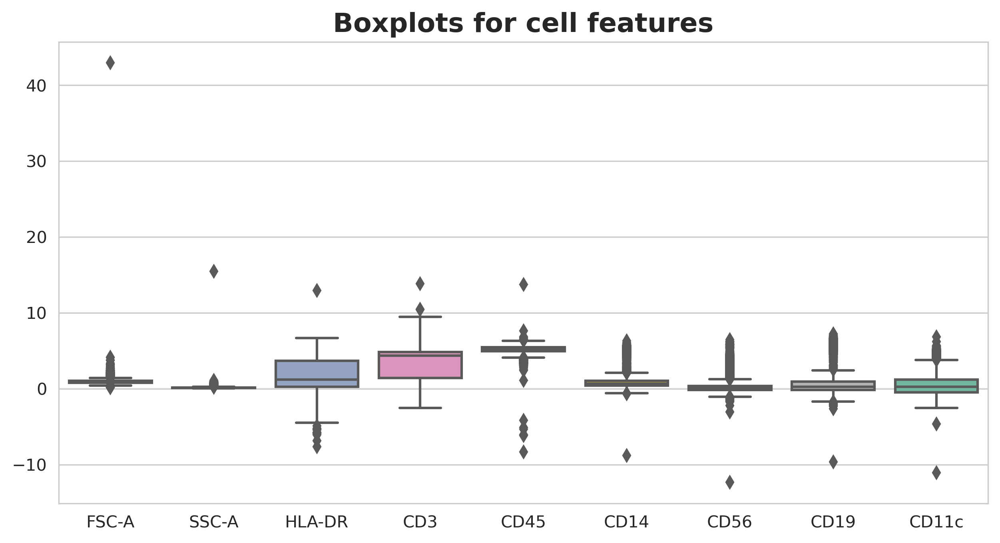

In [436]:
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
sns.boxplot(data=fc_data, palette="Set2")
plt.title("Boxplots for cell features", fontweight="bold", size=16)

Obviousely, there are some outliers in data. Let's remove them.

In [437]:
low = .005
high = .995
quant_df = fc_data.quantile([low, high])

fc_data_wo_out = fc_data.apply(lambda x: x[(x > quant_df.loc[low, x.name]) & 
                                    (x < quant_df.loc[high, x.name])], axis=0)
fc_data_wo_out.dropna(inplace=True)

In [438]:
fc_data_wo_out.shape

(9289, 9)

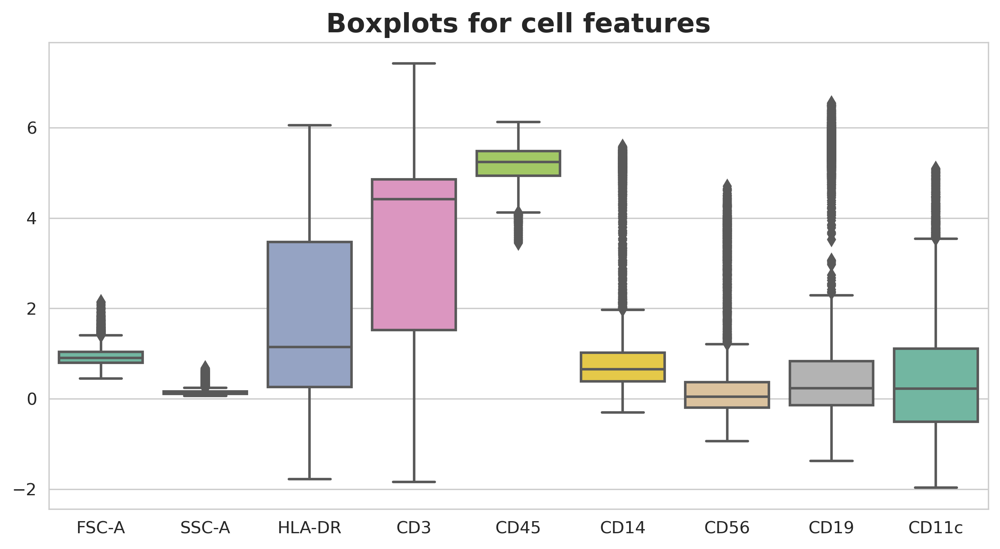

In [439]:
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
sns.boxplot(data=fc_data_wo_out, palette="Set2")
plt.title("Boxplots for cell features", fontweight="bold", size=16);

Much better, I think.

5) Let's visualize distribution for features

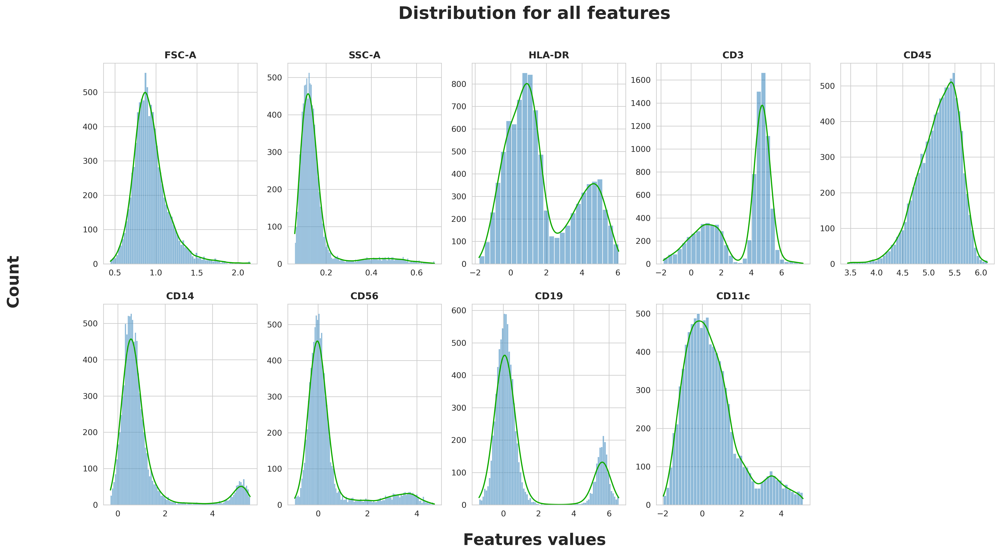

In [440]:
## histplot for all features
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 10), dpi=300)

for i, ax in zip(range(9), axes.flat):
    sns.histplot(fc_data_wo_out.iloc[:, i], kde=True, ax=ax)
    ax.set(xlabel='', ylabel='')
    ax.set_title(fc_data.columns[i], fontsize=12, fontweight='bold')
    ax.lines[0].set_color("#1a0")
    
fig.suptitle("Distribution for all features", fontsize=22, fontweight="bold")
fig.text(0.5, 0.04, 'Features values', ha='center', 
         fontsize=20, fontweight='bold')
fig.text(0.04, 0.5, 'Count', va='center', 
         rotation='vertical', fontsize=20, fontweight='bold')
fig.delaxes(axes[1][4])

plt.show();

6) Let's check whether our features correlates with each other

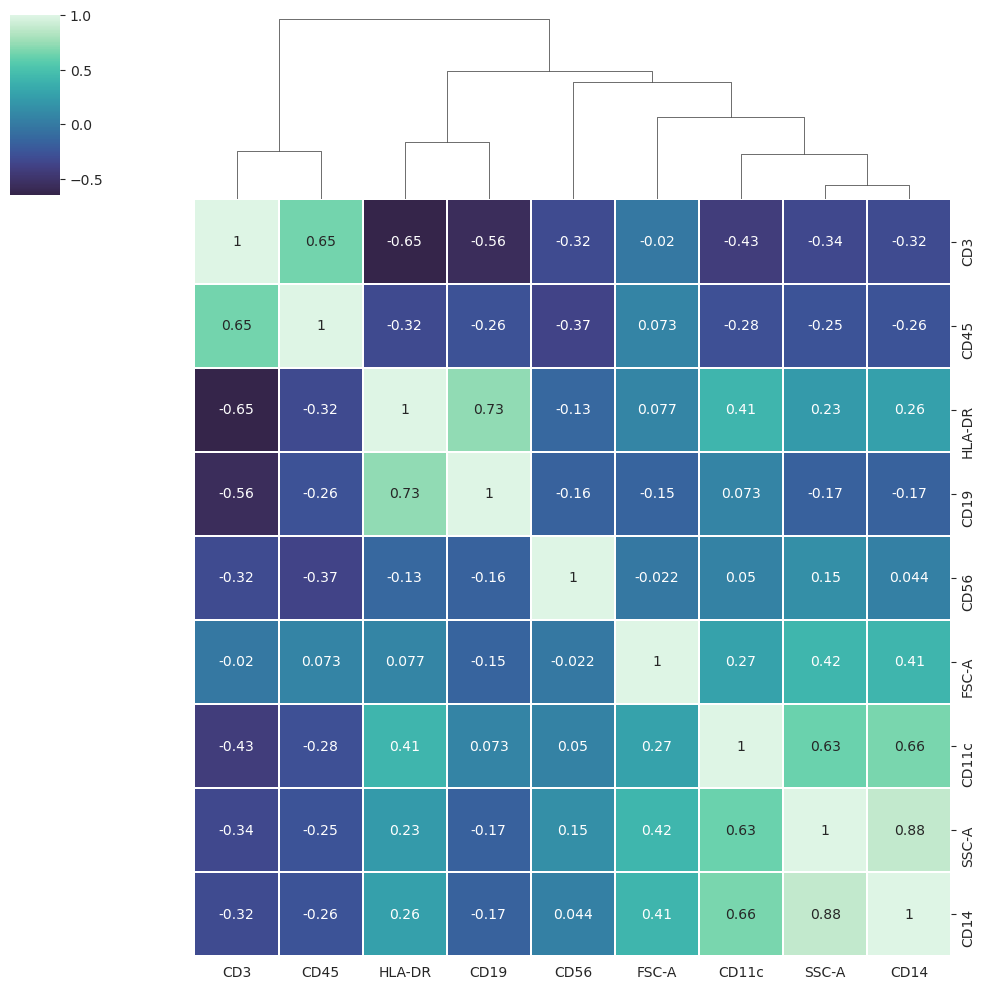

In [442]:
corr = fc_data_wo_out.corr()
cg = sns.clustermap(corr, center=0, linewidths=.1, annot = True, 
                    figsize=(10, 10), cmap="mako")
cg.ax_row_dendrogram.set_visible(False)
plt.show();

#### 3.2. Кластеризация

4.5 балла

При ручной аннотации клеточных типов обычно поступают следующим образом:

1. При помощи методов понижения размерности рисуют наши наблюдения, чтобы примерно оценить число клеточных типов
2. Проводят кластеризацию наблюдений (для некоторых методов нужно заранее задать число кластеров, поэтому нам как раз помогает п.1)
3. Далее мы считаем, что клетки, которые алгоритм отнес к одному кластеру являются одним клеточным типом (если кластеров больше, чем типов клеток, то возможно, что 2 разных кластера являются одним типом)
4. После чего по интенсивности экспрессии поверхностных маркеров мы присваиваем кластеру клеточный тип

Давайте для начала напишем удобную функцию для визуализации наших многомерных данных в пространстве размерностью 2, делать мы это будем при помощи алгоритма t-SNE.

Поиграться с красивой визуализацией можно [тут](https://distill.pub/2016/misread-tsne/).

In [652]:
def plot_tsne(data, n_iter=1000, 
              perplexity=40, color=None):
    """
    Функция для отрисовки результатов работы t-SNE
        :param data: таблица объекты х признаки
        :param n_iter: число итераций градиентного спуска,
            может быть полезно увеличить, чтобы получить результаты получше
        :param perplexity: 
        :param color: np.array[n_samples] с переменной,
            которой мы хотим покрасить наши наблюдения
        :return tsne_emb: np.array[n_samples, 2] - результаты работы t-SNE
    """
    
    # Сначала сделаем PCA, так как это хорошее начальное приближение для t-SNE
    # позволит алгоритму быстрее сойтись
    pca = PCA().fit(data)
    pca_embedding = pca.transform(data)
    
    # Запустим t-SNE, он выдаст нам для каждого объекта по 2 числа, 
    # которые мы сможем нарисовать
    tnse = TSNE(n_components=2, init=pca_embedding[:, :2], n_jobs=-1,
                n_iter=n_iter, perplexity=perplexity)
    tsne_embedding = tnse.fit_transform(pca_embedding)
    
    sns.scatterplot(x=tsne_embedding[:, 0],
                    y=tsne_embedding[:, 1],
                    hue=color, palette="Set2")
    plt.xlabel("$TSNE_1$", fontsize=18)
    plt.ylabel("$TSNE_2$", fontsize=18)
    
    # Вернем также результаты t-SNE, так как, если потом захотим перестроить картинку,
    # в таком случае нам не придется ждать заново, просто нарисуем новую с готовыми данными
    
    return tsne_embedding

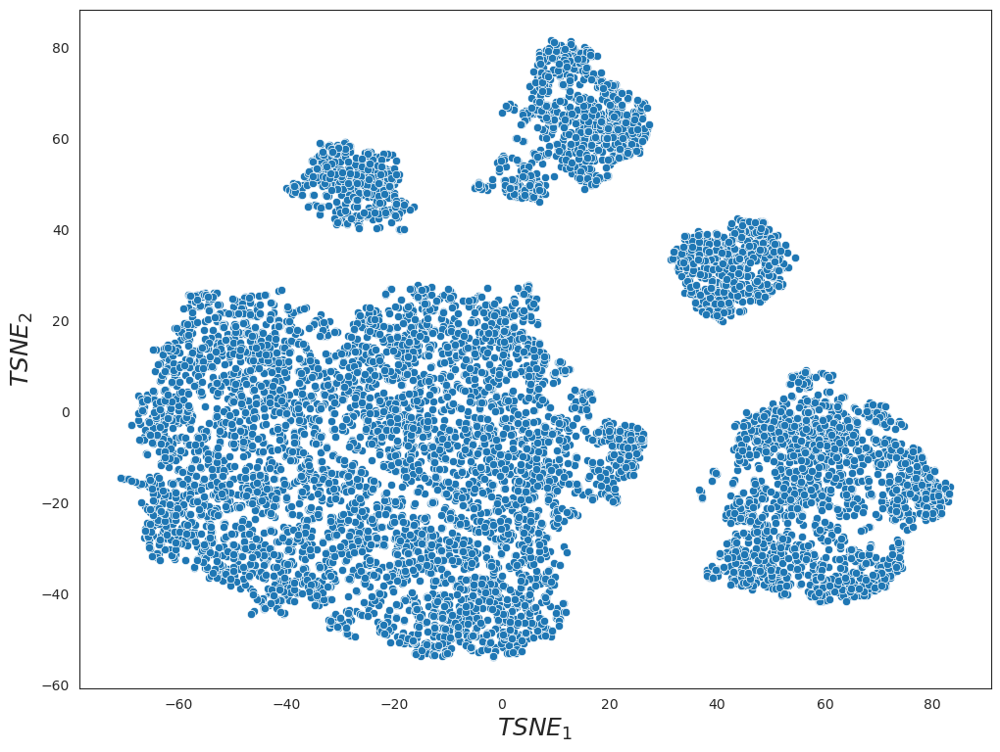

In [653]:
tsne_res = plot_tsne(fc_data_wo_out)

Кластеризуйте ваши данные:

1. Попробуйте методы кластеризации из тех, что мы прошли
2. Выберите лучший на основании метрики `silhouette_score` (попробуйте также подобрать гиперпараметры)
3. Присвойте каждому наблюдению метку класса и нарисуйте график t-SNE, покрасив точки метками кластера

#### KMeans

Firstly, I tried to choose parameters for clusterization.

In [510]:
def tune_kmeans(n_clusters, inits, algorithms, visualize=False):  
    compare_dict = {"n_clusters": [], "init": [], "algorithm": [], "silhouette": []}
    pred_labels_list = []
    for n in n_clusters:
        for init in inits:
            for alg in algorithms:
                compare_dict["n_clusters"].append(n)
                compare_dict["init"].append(init)
                compare_dict["algorithm"].append(alg)
                kmeans = KMeans(n_clusters=n, random_state=SEED, init=init, algorithm=alg)
                pred_labels = kmeans.fit_predict(tsne_res)
                pred_labels_list.append(pred_labels)
                compare_dict["silhouette"].append(silhouette_score(tsne_res, pred_labels))
                
    if visualize:
        fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 15), dpi=300)
        for i, pred, n, ax in zip(range(5), pred_labels_list, 
                                  n_clusters, axes.flat):
            unique_labels = np.sort(np.unique(pred))
            sns.scatterplot(tsne_res[:, 0], tsne_res[:, 1], hue=pred,
                            palette="Set2", legend=False,
                            hue_order=unique_labels, ax=ax)
            ax.set_xlabel("$X_1$", fontsize=18)
            ax.set_ylabel("$X_2$", fontsize=18)
            ax.set_title(f'Visualization for {n} clusters', fontsize=12, fontweight='bold')
    
            for label in pred:
                center = tsne_res[(pred == label)].mean(axis=0)
                ax.scatter(center[0], center[1], s=80, c="#201F12", marker=(5, 2))
            
        fig.delaxes(axes[1][2]);
    
    compare_dataframe = pd.DataFrame(compare_dict)  
    return compare_dataframe

In [478]:
n_clusters = [2, 3, 4, 5, 6, 8, 10]
inits = ["k-means++", "random"]
algorithms = ["auto", "elkan"] # auto stand for lloyd

In [479]:
kmeans_params = tune_kmeans(n_clusters, inits, algorithms)

In [480]:
kmeans_params.sort_values("silhouette", ascending=False)

,n_clusters,init,algorithm,silhouette
23,8,random,elkan,0.478857
22,8,random,auto,0.478857
20,8,k-means++,auto,0.478687
21,8,k-means++,elkan,0.478687
4,3,k-means++,auto,0.471271
5,3,k-means++,elkan,0.471271
6,3,random,auto,0.471208
7,3,random,elkan,0.471208
16,6,k-means++,auto,0.461570
17,6,k-means++,elkan,0.461570


,n_clusters,init,algorithm,silhouette
0,3,random,elkan,0.471208
1,4,random,elkan,0.441501
2,5,random,elkan,0.445530
3,6,random,elkan,0.461559
4,8,random,elkan,0.478857


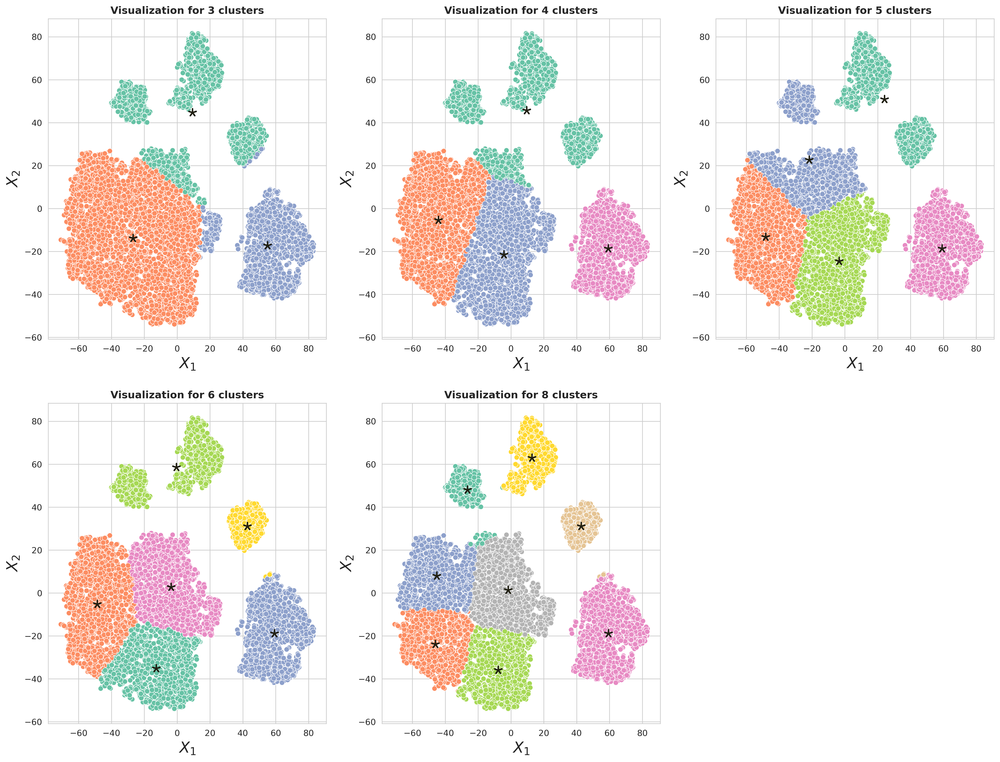

In [511]:
n_clusters = [3, 4, 5, 6, 8]
inits = ["random"]
algorithms = ["elkan"]
tune_kmeans(n_clusters=n_clusters, inits=inits, algorithms=algorithms, visualize=True)

#### Agglomerative Clustering

In [527]:
def aggclust_algorithm_selection(X, n_clusters, distances, algorithms):
    """
    Для заданных алгоримов кластеризации и гиперпараметров 
    считает различные метрики кластеризации
        :param X: наши данные (n_samples, n_features)
        :param n_clusters: количество кластеров
        :param distances: список возможных метрик расстояния
        :param algorithm: параметр linkage ('average', 'single', 'complete')
    :return compare_dataframe: таблица с метриками кластеризации
    """

    
    compare_dict = {"n_clusters": [], "distance": [], "linkage": [], "silhouette": []}
        
    for dist in distances:
        for alg in algorithms:
            for n in n_clusters:
                compare_dict["n_clusters"].append(n)
                compare_dict["distance"].append(dist)
                compare_dict["linkage"].append(alg)
                agg_clust = AgglomerativeClustering(n_clusters=n, affinity=dist, linkage=alg)
                pred_labels = agg_clust.fit_predict(X)
                compare_dict["silhouette"].append(silhouette_score(X, pred_labels, metric=dist))
    
    compare_dataframe = pd.DataFrame(compare_dict)    
    return compare_dataframe

In [528]:
n_clusters = [2, 3, 4, 5, 6, 8, 10]
algorithms = ['average', 'single', 'complete']
distances = ["euclidean", "manhattan", "cosine", "chebyshev", 
             "minkowski", "canberra", "jaccard"]

In [529]:
aggclust_selection = aggclust_algorithm_selection(fc_data_wo_out, n_clusters=n_clusters, distances=distances,
                                                  algorithms=algorithms)

In [530]:
aggclust_selection.sort_values(["silhouette"], ascending=False)

,n_clusters,distance,linkage,silhouette
58,4,cosine,complete,0.854133
44,4,cosine,average,0.853787
45,5,cosine,average,0.842130
59,5,cosine,complete,0.823788
43,3,cosine,average,0.790187
...,...,...,...,...
129,5,jaccard,average,0.000000
128,4,jaccard,average,0.000000
127,3,jaccard,average,0.000000
126,2,jaccard,average,0.000000


For Agglomerative Clustering the most suitable parameters: *4* clusters, *cosine* distance and *complete* algorithm. Let's visualize clustering.

Silhouette score: 0.8541328473148139


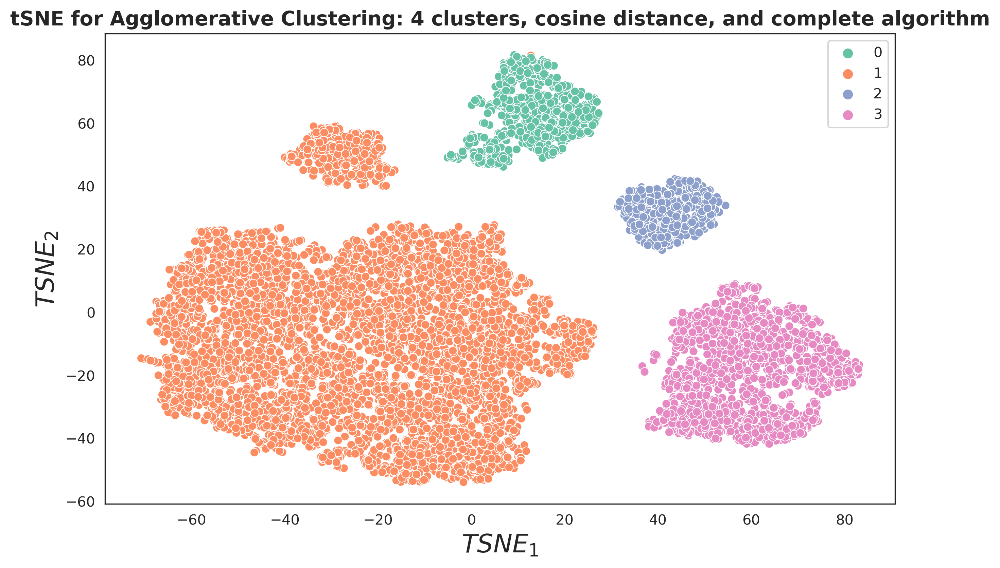

In [654]:
agg_clust = AgglomerativeClustering(n_clusters=4, affinity='cosine', linkage='complete')
agg_pred_labels = agg_clust.fit_predict(fc_data_wo_out)
print(f'Silhouette score: {silhouette_score(fc_data_wo_out, agg_pred_labels, metric="cosine")}')

fig, ax = plt.subplots(figsize=(10,6), dpi=300)
ax.set_title("tSNE for Agglomerative Clustering: 4 clusters, cosine distance, and complete algorithm",
             size=14, fontweight="bold")
tsne_res_agg = plot_tsne(fc_data_wo_out, color=agg_pred_labels)

#### DBSCAN

In [606]:
def dbscan_algorithm_selection(X, epsilons, min_samples, algorithms, distances):
    compare_dict = {"epsilons": [], "min_samples": [], "algorithms": [], 
                    "distances": [], "silhouette": []}
        
    for eps in epsilons:
        for min_s in min_samples:
            for alg in algorithms:
                for dist in distances:
                    compare_dict["epsilons"].append(eps)
                    compare_dict["min_samples"].append(min_s)
                    compare_dict["algorithms"].append(alg)
                    compare_dict["distances"].append(dist)
                    dbscan_model = DBSCAN(eps=eps, min_samples=min_s,
                                          algorithm=alg, metric=dist)
                    pred_labels = dbscan_model.fit_predict(X)
                    if len(np.unique(dbscan_model.labels_)) > 2:
                        compare_dict["silhouette"].append(silhouette_score(X, pred_labels, metric=dist))
                    else:
                        compare_dict["silhouette"].append(np.nan)
    
    compare_dataframe = pd.DataFrame(compare_dict)    
    return compare_dataframe

In [607]:
epsilons = [2, 3, 4, 5, 8, 10, 12]
min_samples = [5, 25, 50, 100]
algorithms = ['auto', 'ball_tree', 'kd_tree', 'brute']
distances = ["euclidean", "manhattan"]

In [611]:
dbscan_selection = dbscan_algorithm_selection(fc_data_wo_out, epsilons, min_samples, algorithms, distances)

In [610]:
dbscan_selection.sort_values("silhouette", ascending=False)

,epsilons,min_samples,algorithms,distances,silhouette
119,5,50,brute,manhattan,0.615208
117,5,50,kd_tree,manhattan,0.615208
115,5,50,ball_tree,manhattan,0.615208
113,5,50,auto,manhattan,0.615208
127,5,100,brute,manhattan,0.614887
...,...,...,...,...,...
219,12,100,ball_tree,manhattan,NaN
220,12,100,kd_tree,euclidean,NaN
221,12,100,kd_tree,manhattan,NaN
222,12,100,brute,euclidean,NaN


For DBSCAN the most suitable parameters: *5* epsilons, *50* min_samples, any of tested algorithms and *manhattan* distance metric. Let's visualize clustering.

Silhouette score: 0.6152076412152538


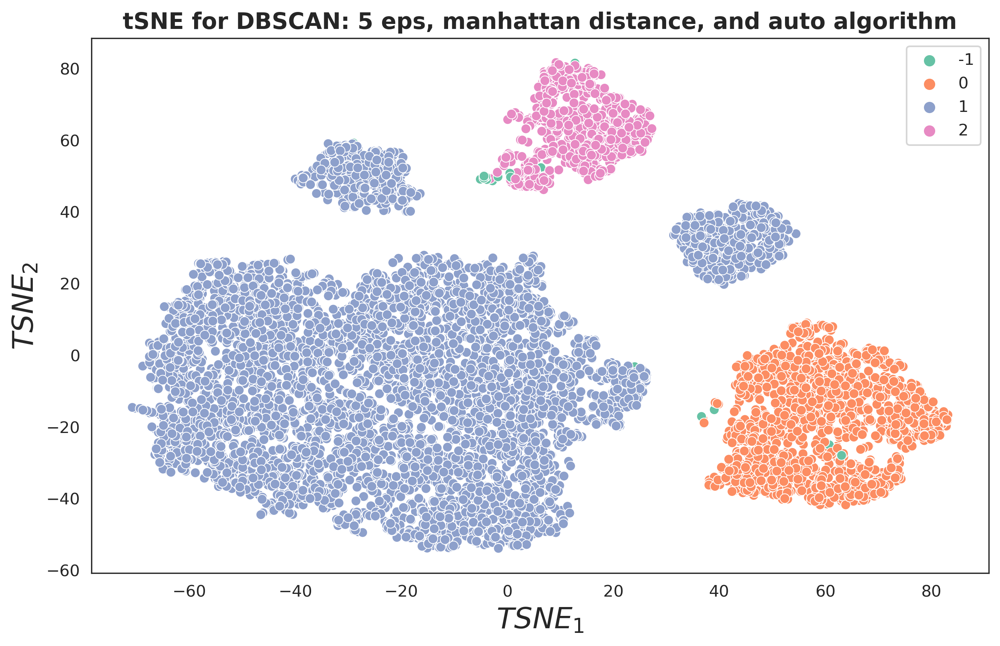

In [655]:
dbscan_model = DBSCAN(eps=5, min_samples=50, algorithm="auto", metric="manhattan")
pred_labels_dbscan = dbscan_model.fit_predict(fc_data_wo_out)
print(f'Silhouette score: {silhouette_score(fc_data_wo_out, pred_labels_dbscan, metric="manhattan")}')

fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
ax.set_title("tSNE for DBSCAN: 5 eps, manhattan distance, and auto algorithm",
             size=14, fontweight="bold")
tsne_res_dbscan = plot_tsne(fc_data_wo_out, color=pred_labels_dbscan)

For clustering cells by their type, probably the most suitable method is **Agglomerative Clustering** with *4* clusters, *cosine* distance and *complete* algorithm.

Удалось ли вам получить ситуацию, где отдельные группы точек покрашены в один цвет?

I hope so. At least, using aforementioned algorithm.

#### 3.3. Аннотация клеточных типов

4 балла

Теперь когда мы подобрали хороший алгоритм кластеризации, можно аннотировать наши клетки. Для этого мы нарисуем t-SNE и покрасим точки в зависимости от интенсивности экспрессии поверхностных маркеров. В датасете присутствуют следующие типы клеток:

* B_cells
* T_cells
* Monocytes
* Other cells

Вам нужно будет выяснить, какие клетки экспрессируют определенные маркеры и присвоить каждому кластеру один из типов клеток.

Для начала нарисуем все это безобразие:

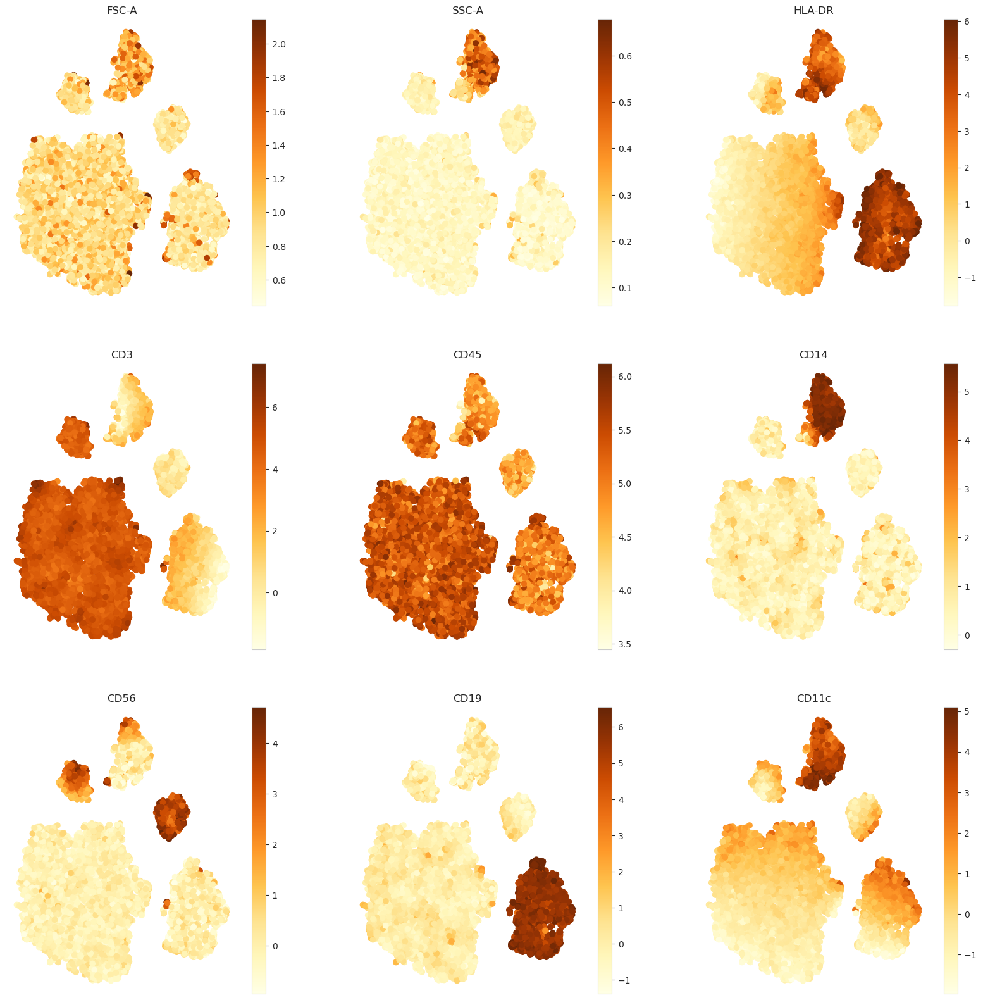

In [626]:
# Результаты t-SNE уже есть в переменной tsne_res
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
for col, ax in zip(fc_data_wo_out.columns, axes.ravel()):
    scatter = ax.scatter(tsne_res[:, 0], tsne_res[:, 1], 
                         c=fc_data_wo_out[col], cmap="YlOrBr")
    fig.colorbar(scatter, ax=ax)
    ax.set_title(col)
    ax.grid(False)
    ax.axis("off")

Markers for immune cells represented in clusters:

- **HLA-DR**: major histocompatibility complex (MHC) II cell surface receptor (HLA-DR) is one of the key cell surface molecules expressed on antigen presenting cells (monocytes, macrophages, and dendritic cells) and is responsible for antigen presentation to T cells and initiation of the inflammatory cascade during infection;
- **CD3**: CD3 is a common antibody for identifying T cells and a member of immunoglobulin superfamily on 11q23; also called OKT3;
- **CD14**: the lipopolysaccharide receptor, the most specific monocyte-associated marker;
- **CD56**: homophilic binding glycoprotein expressed on the surface of neurons, glia and skeletal muscle;
- **CD19**: is a biomarker for normal and neoplastic B cells, as well as follicular dendritic cells;
- **CD11c**: is a widely established marker for dendritic cells.

Silhouette score: 0.8541328473148139


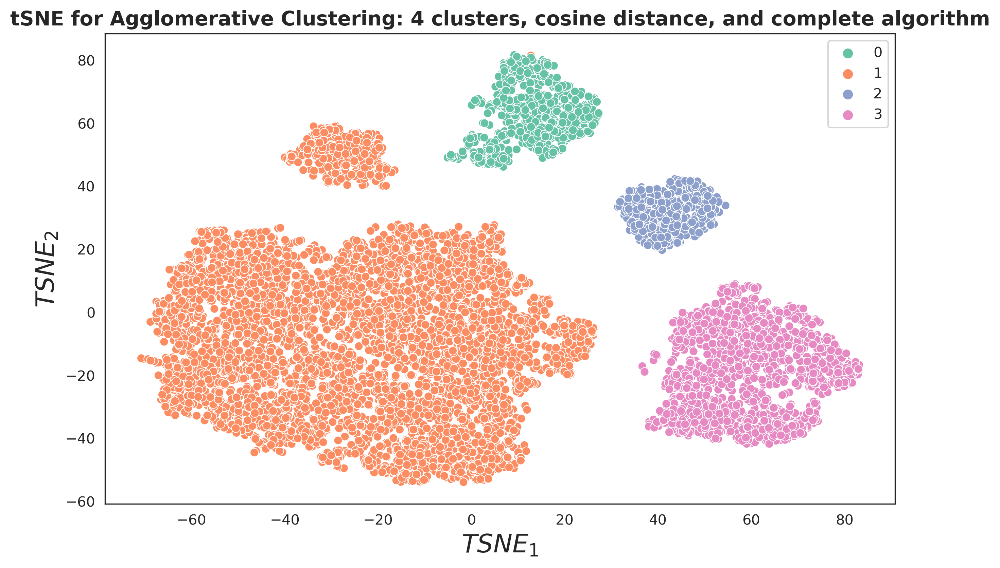

In [656]:
agg_clust_full = AgglomerativeClustering(n_clusters=4, affinity='cosine', linkage='complete')
agg_pred_labels_full = agg_clust_full.fit_predict(fc_data_wo_out)
print(f'Silhouette score: {silhouette_score(fc_data_wo_out, agg_pred_labels_full, metric="cosine")}')

fig, ax = plt.subplots(figsize=(10,6), dpi=300)
ax.set_title("tSNE for Agglomerative Clustering: 4 clusters, cosine distance, and complete algorithm",
             size=14, fontweight="bold")
tsne_res_agg_full = plot_tsne(fc_data_wo_out, color=agg_pred_labels_full)

Дальше дело за вами, нужно определить клеточный тип для каждого кластера и записать их как значения в словаре:

In [634]:
cell_type_cluster_map = {0: "Monocytes", 
                         1: "T_cells", 
                         2: "Other cells", 
                         3: "B_cells"}

In [635]:
labeled_fc_data = fc_data_wo_out.assign(Population=agg_clust_full.labels_)
labeled_fc_data["Population"] = labeled_fc_data["Population"].map(cell_type_cluster_map)

Посчитайте, как распределены типы клеток:

In [636]:
labeled_fc_data.Population.value_counts()

T_cells        6031
B_cells        1800
Monocytes       898
Other cells     560
Name: Population, dtype: int64

Сохраните ваши результаты в csv файл, мы сравним их с правильными ответами по метрике `f1_score(average="macro")`, которая хорошо подходит, даже если классы не сбалансированы.

In [638]:
labeled_fc_data.to_csv(join(DATA_PATH, "labeled_fc_data.csv"), index=False)

#### 3.4. Атоматическая аннотация

**дополнительные** 5 баллов

Это задание является дополнительным. Вам нужно построить классификатор клеточных типов на основе размеченных вами данных. Пока что мы прошли не так много разных классификаторов, но уже есть из чего выбирать.

Оцените качество полученной модели при помощи `f1_score(average="macro")`. Попробуйте его улучшить, каким-то образом поработав с дисбалансом классов ([помощь](https://elitedatascience.com/imbalanced-classes)).

In [639]:
X = labeled_fc_data.drop("Population", axis=1)
y = labeled_fc_data["Population"]

In [645]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

In [646]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((7431, 9), (1858, 9), (7431,), (1858,))

#### kNN

In [647]:
knn_pipeline = Pipeline(steps=[('scaler', StandardScaler()),
                               ('classifier', KNeighborsClassifier())])

knn_pipeline.fit(X_train, y_train)
y_pred = knn_pipeline.predict(X_test)

print(f'f1_score: {f1_score(y_test, y_pred, average="macro")}')

f1_score: 1.0


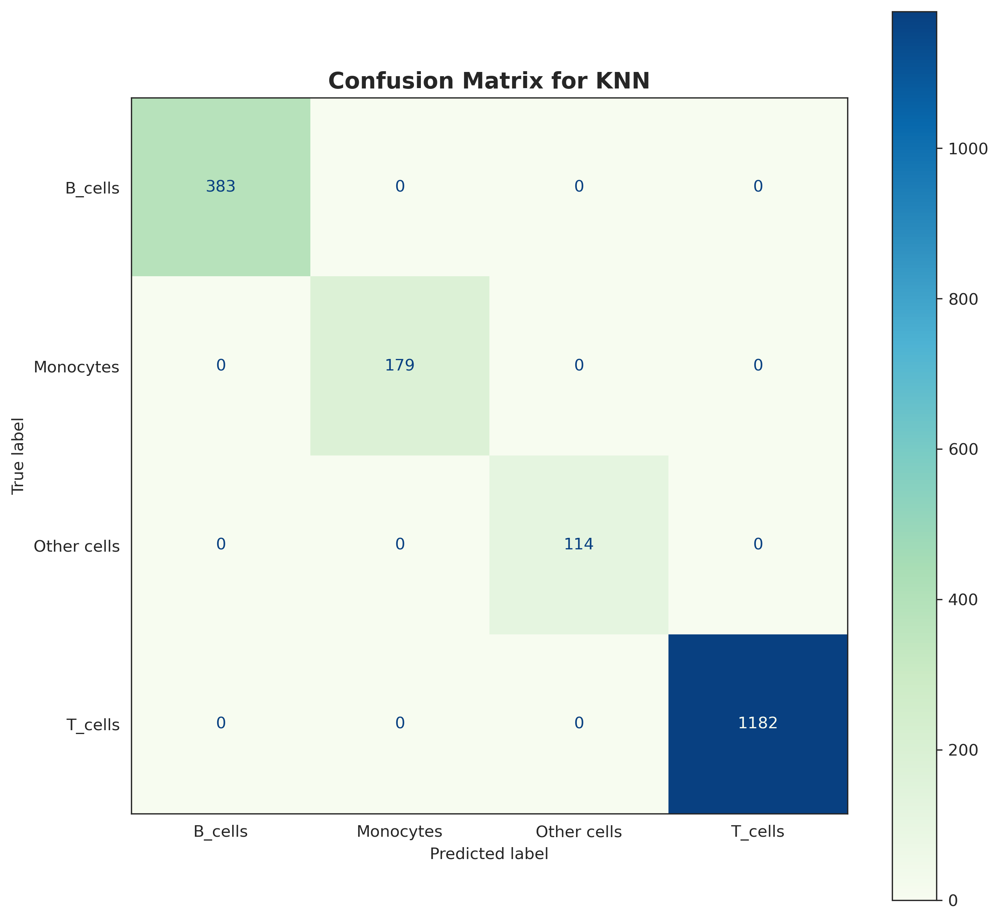

In [671]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sns.set_style("white")
knn_conf_matrix = ConfusionMatrixDisplay.from_estimator(knn_pipeline, X_test, y_test,
                                                        display_labels=np.unique(y),
                                                        cmap="GnBu", ax=ax)
knn_conf_matrix.ax_.set_title("Confusion Matrix for KNN", fontweight='bold', size=14);

#### Logistic Regression

In [663]:
lreg_pipeline = Pipeline(steps=[('scaler', StandardScaler()),
                                ('classifier', LogisticRegression(max_iter=1000))])

lreg_pipeline.fit(X_train, y_train)
y_pred = lreg_pipeline.predict(X_test)

print(f'f1_score: {f1_score(y_test, y_pred, average="macro")}')

f1_score: 1.0


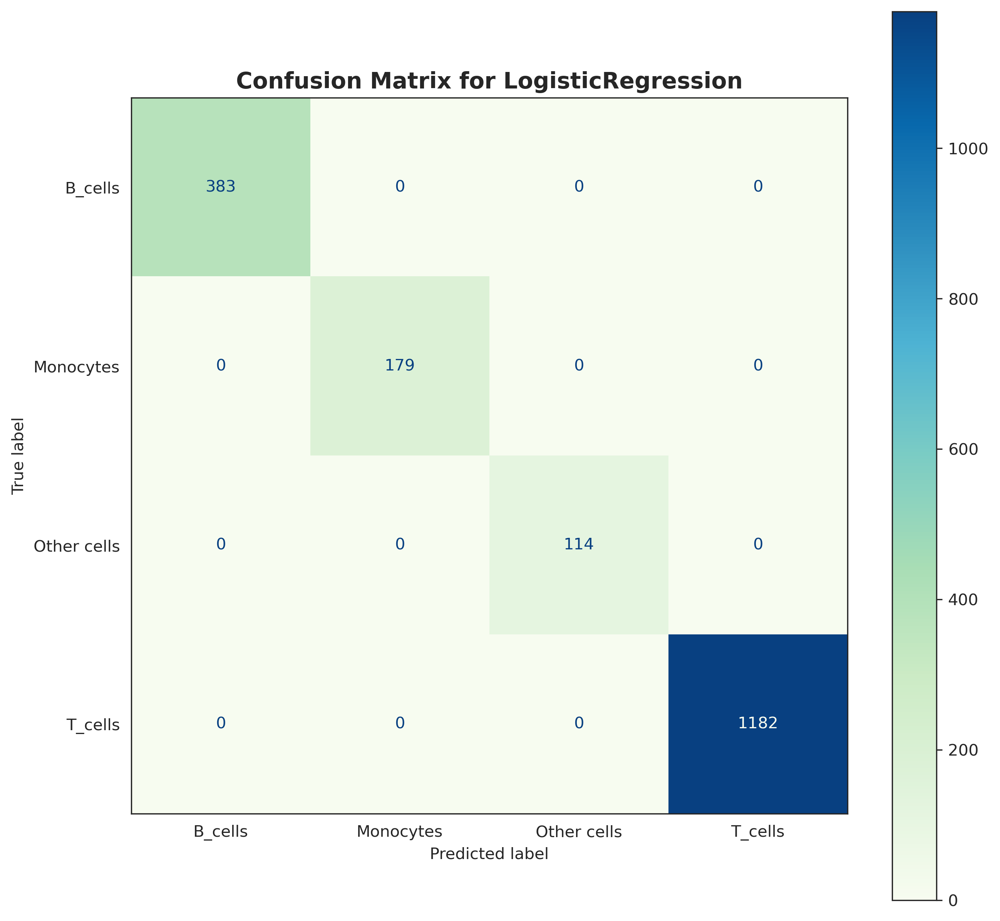

In [669]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sns.set_style("white")
lreg_conf_matrix = ConfusionMatrixDisplay.from_estimator(knn_pipeline, X_test, y_test,
                                                        display_labels=np.unique(y),
                                                        cmap="GnBu", ax=ax)
lreg_conf_matrix.ax_.set_title("Confusion Matrix for LogisticRegression", fontweight='bold', size=14);

### Задание 4. Любимое место

дополнительно 0.5 балла

Расскажите о вашем любимом месте, куда бы вы хотели съездить этой весной, если вы уже там бывали, то прикрепите фотографию)

Этой весной мне бы очень хотелось съездить к своим друзьям, которые сейчас разъехались по всему миру от Италии до Австралии:) у меня билеты в Питер на празднование 10 летия ИБ, поэтому маленькое путешествие запланировано.

Однажды я была ранней осенью в Калуге, очень понравился этот город (может быть, под настроение тогда зашёл). Рядом с ним есть арт-парк [Никола-Ленивец](https://nikola-lenivets.ru/), если вдруг будешь в России и захочется съездить в Калугу:D, очень советую.

На самом деле, одно из самых красивых мест, которые я посещала, это мой родной город Надым, ЯНАО. Если тебе нравится романтика пустоты, вечной мерзлоты, низкого серого неба и пейзажи лесотундры, или ты никогда не видел вживую ничего подобного, то вот тебе фотография:)

![лесотундра](./photo_2021-11-18_13-09-28.jpg)

### Therapy time

Напишите здесь ваши впечатления о задании: было ли интересно, было ли слишком легко или наоборот сложно и тд. Также сюда можно написать свои идеи по улучшению заданий, а также предложить данные, на основе которых вы бы хотели построить следующие дз.

**Ваши мысли:**